# A Machine Learning Study: Exploring Shark Attack Incidents Worldwide

This notebook leverages a dataset containing records of shark attack incidents worldwide to explore and visualize the frequency of these occurrences. By analyzing this data, we gain insights into the geographic distribution of shark attacks, shedding light on areas where such incidents are more prevalent. Towards the end of the notebook, a heat map is presented, providing a visual representation of the regions most affected by shark attacks. 

### Shark data (import and visualization)

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install seaborn
!pip install scikit-learn

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn import preprocessing

""" 
Setting display.max_columns to None ensures that Pandas will display all columns of a DataFrame, 
regardless of its size. This can be useful when working with datasets that have a large number of columns, 
as it allows you to see all the available data without truncation.
It improves the readability and usability of the DataFrame, especially when exploring or analyzing 
the data interactively.
"""
pd.set_option("display.max_columns",None)

"""
The low_memory=False parameter is optional and was set to False.
When set to False, it instructs pandas not to attempt to infer the data type of each column automatically,
which can save memory in cases where the file has many columns with mixed data types or large amounts of data.
This can be useful when working with large files or varied data types.
However, setting low_memory=False may consume more RAM during the file reading process,
we're reading the dataset.
"""
df = pd.read_csv("./inputs/sharks/GSAF5.xls.csv", low_memory=False)
print(df.columns)

df = df[['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area',
       'Location', 'Activity', 'Name', 'Unnamed: 9', 'Age', 'Time','Species ','Fatal (Y/N)','Injury']]


"""
It's not strictly necessary to maintain the original order of columns when renaming them. 
However, doing so can enhance clarity, consistency, and compatibility with existing code.
"""
# Renaming column ('Unnamed: 9' to 'Victim\'s Gender')
df.columns = ['Case Number', 'Date', 'Year', 'Type', 'Country', 'Area',
       'Location', 'Activity', 'Name', 'Victim\'s Gender', 'Age', 'Time','Species','Fatal', 'Injury']

# Amount of "(lines, columns)" respectively
print(df.shape)

df.head()

Index(['index', 'Case Number', 'Date', 'Year', 'Type', 'Country', 'Area',
       'Location', 'Activity', 'Name',
       ...
       'Unnamed: 246', 'Unnamed: 247', 'Unnamed: 248', 'Unnamed: 249',
       'Unnamed: 250', 'Unnamed: 251', 'Unnamed: 252', 'Unnamed: 253',
       'Unnamed: 254', 'Unnamed: 255'],
      dtype='object', length=257)
(6462, 15)


,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Victim's Gender,Age,Time,Species,Fatal,Injury
0,2020.02.05,05-Feb-2020,2020.0,Unprovoked,USA,Maui,NaN,Stand-Up Paddle boarding,NaN,NaN,NaN,09h40,Tiger shark,N,"No injury, but paddleboard bitten"
1,2020.01.30.R,Reported 30-Jan-2020,2020.0,Provoked,BAHAMAS,Exumas,NaN,Floating,Ana Bruna Avila,F,24,NaN,NaN,N,PROVOKED INCIDENT Scratches to left wrist
2,2020.01.17,17-Jan-2020,2020.0,Unprovoked,AUSTRALIA,New South Wales,Windang Beach,Surfing,Will Schroeter,M,59,08h00,"""A small shark""",N,Laceration ot left ankle and foot
3,2020.01.16,16-Jan-2020,2020.0,Unprovoked,NEW ZEALAND,Southland,Oreti Beach,Surfing,Jordan King,F,13,20h30,Broadnose seven gill shark?,N,Minor injury to lower leg
4,2020.01.13,13-Jan-2020,2020.0,Unprovoked,USA,North Carolina,"Rodanthe, Dare County",Surfing,Samuel Horne,M,26,14h33,NaN,N,Lacerations to foot


In [4]:
np.array(df.isna() == True)

array([[False, False, False, ..., False, False, False],
       [False, False, False, ...,  True, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ...,  True, False, False],
       [False, False, False, ...,  True, False, False],
       [False, False, False, ...,  True, False, False]])

In [5]:
"""
This code is using the .isnull () method of the DataFrame to check null values in each column
and then it is adding the number of null values in each of these columns, to obtain its total.
"""
df.isnull().sum()

Case Number           2
Date                  1
Year                  3
Type                  5
Country              51
Area                463
Location            545
Activity            552
Name                215
Victim's Gender    6434
Age                2871
Time               3392
Species            2924
Fatal               547
Injury               29
dtype: int64

In [6]:
"""
The nunique() function in Pandas is used to count the number of unique values in a specific column of a DataFrame.
Applying this function to the 'Country' column provides valuable insight into the shark incidents,
highlighting the global nature of shark attacks documented in the dataset. 
This information is crucial for understanding the geographical distribution and scope of the dataset.
"""
df['Country'].nunique()

205

### Occurrences of Shark Incidents by Country

In [7]:
"""
The "value_counts()" function shows the occurrences of shark attacks by country.
The "reset_index()" method converts the results into a DataFrame.
Finally, "head(20)", wich is also a method exhibits the top twenty countries with the highest
number of occurrences, offering a quick view of the most affected countries by shark attacks,
Brazil (the country where I live) is in the seventh position.
"""
# Selecting the column 'Country' from the DataFrame and adding the function `value_counts()`
# in order to create the 'count' column, so that we can find out the number of occurrences, respectively.
df_country = df['Country'].value_counts()

# Counting the occurrences of shark attacks by country and storing the result in a DataFrame
df_country = df['Country'].value_counts().reset_index()

# Displaying the top 20 countries with the highest number of shark attack occurrences
df_country.head(20)

,Country,count
0,USA,2310
1,AUSTRALIA,1374
2,SOUTH AFRICA,585
3,NEW ZEALAND,135
4,PAPUA NEW GUINEA,135
5,BAHAMAS,115
6,BRAZIL,113
7,MEXICO,95
8,ITALY,71
9,FIJI,62


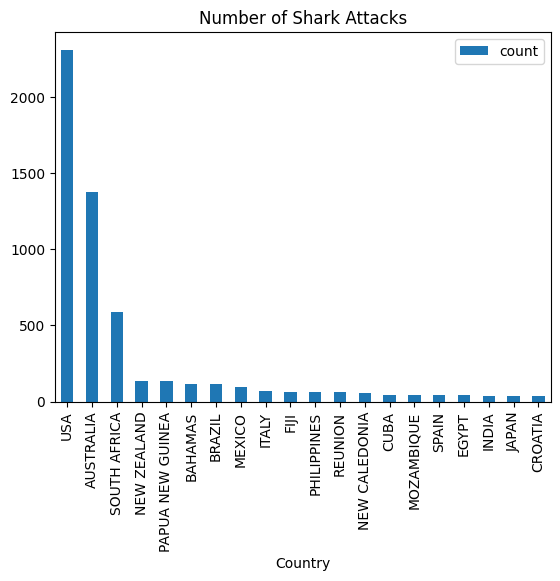

In [8]:
# Plotting a bar graph that shows the 20 countries with the most occurrences of shark attacks
df_country.head(20).plot.bar('Country')

# Adding a title to the graph
plt.title("Number of Shark Attacks")

# Displaying the graph
plt.show()

As a percentage of the total, USA is 36% and Australia is 21%, so these two countries account for half of the total.

In [9]:
# Calculate the rate of shark attack occurrences for each country relative to the total occurrences worldwide
# by dividing the number of shark attack occurrences for each country by the total occurrences of all countries.
# Add a new column 'rate' to the DataFrame df_country to store these rates.
df_country['rate'] = df_country.iloc[:,1] / df_country['count'].sum()

# Display the first five rows of the DataFrame df_country, including the new 'rate' column.
df_country.head(5)

,Country,count,rate
0,USA,2310,0.360318
1,AUSTRALIA,1374,0.214319
2,SOUTH AFRICA,585,0.091249
3,NEW ZEALAND,135,0.021058
4,PAPUA NEW GUINEA,135,0.021058


In [10]:
# The count of shark attacks is stored in the column 'Type'.
# The reset_index() method is used to reset the index of the resulting DataFrame, ensuring that 
# the row labels are sequential integers, since that facilitates the access to specific rows and enhances
# compatibility with various data manipulation operations in many libraries. 
df_Area = df[['Country','Area','Type']].groupby(['Country','Area']).count().reset_index().sort_values('Type',ascending=False)

df_Area.head(20)

,Country,Area,Type
787,USA,Florida,1076
11,AUSTRALIA,New South Wales,498
14,AUSTRALIA,Queensland,325
790,USA,Hawaii,312
782,USA,California,294
679,SOUTH AFRICA,KwaZulu-Natal,215
21,AUSTRALIA,Western Australia,197
683,SOUTH AFRICA,Western Cape Province,195
677,SOUTH AFRICA,Eastern Cape Province,165
812,USA,South Carolina,162


## Geolocation Data (Importing and Processing)

In [11]:
# Opening the dataset [Geolocation Data](https://www.kaggle.com/datasets/liewyousheng/geolocation/data)
# and reading the 'inputs/geolocation/cities.csv' file in order to obtain a better parameter in geolocation
# and cross with the data from the Shark dataset.
place_data = pd.read_csv('./inputs/geolocation/cities.csv')

In [12]:
# Selecting only the columns 'state_name', 'country_name', 'latitude', and 'longitude' from the DataFrame place_data
# and storing the result back into the variable place_data.
place_data = place_data[['state_name','country_name','latitude','longitude']]

# Cleaning the data by removing duplicate rows based on the combination of 'state_name' and 'country_name'
# subset parameter specifies the columns to consider when identifying duplicates.
# In this case, we want to drop rows where both 'state_name' and 'country_name' are the same.
place_data = place_data.drop_duplicates(subset=['state_name','country_name'])

In [13]:
# Manipulating string data in the 'state_name' column of the 'place_data' DataFrame:
# 1. Converting all letters in the 'state_name' column to lowercase using the str.lower() method.
place_data['state_name'] = place_data['state_name'].str.lower()

# 2. Removing all whitespace characters (' ') from the 'state_name' column using the str.replace() method.
# This step ensures consistency in string formatting and removes unnecessary whitespace.
place_data['state_name'] = place_data['state_name'].str.replace(' ', '')

place_data.head(10)

,state_name,country_name,latitude,longitude
0,badakhshan,Afghanistan,36.68333,71.53333
6,badghis,Afghanistan,35.73062,63.78264
8,baghlan,Afghanistan,36.13068,68.70829
12,balkh,Afghanistan,36.75635,66.89720
18,bamyan,Afghanistan,34.82156,67.82734
20,daykundi,Afghanistan,33.76329,66.07617
21,farah,Afghanistan,32.37451,62.11638
22,faryab,Afghanistan,36.95293,65.12376
24,ghazni,Afghanistan,33.55391,68.42096
25,ghōr,Afghanistan,34.51952,65.25093


In [14]:
"""
The shape attribute of a DataFrame or a NumPy array returns a tuple representing the dimensions of the 
data structure. In the specific case of place_data.shape, it returns 
a tuple with two elements: the first element represents the number of rows (or entries) 
in the DataFrame or array, and the second element represents the number of columns (or features) 
in the DataFrame or array. Therefore, when calling place_data.shape, you will obtain the 
total number of entries (or records) and the total number of features (or variables) in the DataFrame place_data. 
This is useful for understanding the data structure and determining its dimensions 
before performing additional operations or analyses.
"""
place_data.shape

(3429, 4)

## Data Merge

In [15]:
df.head()

,Case Number,Date,Year,Type,Country,Area,Location,Activity,Name,Victim's Gender,Age,Time,Species,Fatal,Injury
0,2020.02.05,05-Feb-2020,2020.0,Unprovoked,USA,Maui,NaN,Stand-Up Paddle boarding,NaN,NaN,NaN,09h40,Tiger shark,N,"No injury, but paddleboard bitten"
1,2020.01.30.R,Reported 30-Jan-2020,2020.0,Provoked,BAHAMAS,Exumas,NaN,Floating,Ana Bruna Avila,F,24,NaN,NaN,N,PROVOKED INCIDENT Scratches to left wrist
2,2020.01.17,17-Jan-2020,2020.0,Unprovoked,AUSTRALIA,New South Wales,Windang Beach,Surfing,Will Schroeter,M,59,08h00,"""A small shark""",N,Laceration ot left ankle and foot
3,2020.01.16,16-Jan-2020,2020.0,Unprovoked,NEW ZEALAND,Southland,Oreti Beach,Surfing,Jordan King,F,13,20h30,Broadnose seven gill shark?,N,Minor injury to lower leg
4,2020.01.13,13-Jan-2020,2020.0,Unprovoked,USA,North Carolina,"Rodanthe, Dare County",Surfing,Samuel Horne,M,26,14h33,NaN,N,Lacerations to foot


In [16]:
# Create a new DataFrame containing only the 'Country' and 'Area' columns from the original DataFrame
df_only_Area = df[['Country', 'Area']]

# Rename the 'Area' column to 'state_name' in order to reflect its content more accurately
df_only_Area.columns = ['Country', 'state_name']

# Convert the values in the 'state_name' column to lowercase
df_only_Area['state_name'] = df_only_Area['state_name'].str.lower()

# Remove whitespace characters from the values in the 'state_name' column
df_only_Area['state_name'] = df_only_Area['state_name'].str.replace(' ', '')

# Display the first few rows of the preprocessed DataFrame
df_only_Area.head()

,Country,state_name
0,USA,maui
1,BAHAMAS,exumas
2,AUSTRALIA,newsouthwales
3,NEW ZEALAND,southland
4,USA,northcarolina


In [17]:
df_only_Area.isnull().sum()

Country        51
state_name    463
dtype: int64

In [18]:
# Perform a left join operation to merge the DataFrame df_only_Area (left) with the place_data DataFrame (right) 
# on the 'state_name' column. This operation is useful when we want to retain all the data from the left DataFrame 
# (df_only_Area) and only add additional information from the right DataFrame (place_data) where available.
df_join = pd.merge(df_only_Area, place_data, how='left', on='state_name')

# Display the shape of the resulting DataFrame to check the number of rows and columns
print(df_join.shape)

# Display the first few rows of the merged DataFrame
df_join.head()

(6704, 5)


,Country,state_name,country_name,latitude,longitude
0,USA,maui,NaN,NaN,NaN
1,BAHAMAS,exumas,NaN,NaN,NaN
2,AUSTRALIA,newsouthwales,Australia,-33.87010,150.86119
3,NEW ZEALAND,southland,NaN,NaN,NaN
4,USA,northcarolina,United States,35.13155,-79.42948


Since the two sets of data have different purposes, there are null data that have not been combined well.
In this case, all nulls will be excluded.

In [19]:
# Check for missing values in the merged DataFrame df_join
df_join.isnull().sum()

Country           51
state_name       463
country_name    2152
latitude        2152
longitude       2152
dtype: int64

In [20]:
# Display the rows where the 'country_name' column is null (missing)
df_join[pd.isnull(df_join.country_name)].head()

,Country,state_name,country_name,latitude,longitude
0,USA,maui,NaN,NaN,NaN
1,BAHAMAS,exumas,NaN,NaN,NaN
3,NEW ZEALAND,southland,NaN,NaN,NaN
5,THAILAND,phangngaprovince,NaN,NaN,NaN
8,NEW CALEDONIA,NaN,NaN,NaN,NaN


In [21]:
"""
# Drop rows with missing values and specific columns from the DataFrame df_join.
# The axis=0 parameter indicates that rows will be dropped.
# The .drop() function is used to remove rows or columns from a DataFrame.
# Here, we remove rows containing missing values using dropna(), and specific columns 
# ('Country', 'country_name', 'state_name') using the 'axis=1' parameter.
"""
df_join = df_join.dropna(axis=0).drop(['Country','country_name','state_name'], axis=1)

# Check for missing values after dropping rows 
print(df_join.isnull().sum())

# Display the shape of the DataFrame after dropping rows and columns
df_join.shape

latitude     0
longitude    0
dtype: int64


(4552, 2)

In [22]:
# This displays the first few rows of the DataFrame, allowing the data to be inspected 
# in order to confirm that the preprocessing steps have been applied correctly.
df_join.head()

,latitude,longitude
2,-33.87010,150.86119
4,35.13155,-79.42948
6,-27.58333,153.03333
7,-33.66364,115.25635
9,-33.66364,115.25635


## Heatmap Visualization

In [23]:
# This command instaled the Folium package, which is used for visualizing geospatial data with interactive maps. 
# Once installed, I was able to import and use Folium in the Jupyter notebook.
!pip install folium

In [24]:
# Convert DataFrame values to a list format
df_list = df_join.values.tolist()

# Import the Folium library for creating interactive maps
import folium
from folium.plugins import HeatMap

# Create a base map centered at latitude 10 and longitude -20, with a zoom level of 3
map = folium.Map(location=[10, -20], zoom_start=3)

# Create a HeatMap layer using the list of values converted from the DataFrame
# with a radius of 7 and a blur factor of 5, and add it to the map
HeatMap(df_list, radius=7, blur=5).add_to(map)

# Display the map
map

Successfully visualized heatmap!

We can see that there are incidents with sharks in various locations in the United States. However, it's important to note that the latitude and longitude data may not be perfectly accurate, resulting in some coloration even on land due to imprecise geolocation data. Nevertheless, exploring this heatmap can still provide valuable insights into areas where shark incidents are more prevalent.

Feel free to interact with the map by moving around the region and zooming in to explore specific areas. This visualization can be useful for gaining awareness and understanding potential risk areas, allowing you to make informed decisions and take precautions when traveling or engaging in activities near coastal areas.

# Shark Attack Prediction

In [25]:
#df = pd.read_csv("./inputs/sharks/GSAF5.xls.csv",low_memory=False)
print(df.info)

df = df[['Case Number','Time', 'Date', 'Year', 'Type', 'Country','Fatal','Injury', 'Area','Location', 'Activity', 'Name', 'Victim\'s Gender', 'Age','Species']]
#df_ml = df[['Time','Country','Location','Fatal','Injury','Age','Species',Activity','Victim\'s Gender']]

<bound method DataFrame.info of        Case Number                  Date    Year        Type  \
0       2020.02.05           05-Feb-2020  2020.0  Unprovoked   
1     2020.01.30.R  Reported 30-Jan-2020  2020.0    Provoked   
2       2020.01.17           17-Jan-2020  2020.0  Unprovoked   
3       2020.01.16           16-Jan-2020  2020.0  Unprovoked   
4       2020.01.13           13-Jan-2020  2020.0  Unprovoked   
...            ...                   ...     ...         ...   
6457       ND.0005           Before 1903     0.0  Unprovoked   
6458       ND.0004           Before 1903     0.0  Unprovoked   
6459       ND.0003             1900-1905     0.0  Unprovoked   
6460       ND.0002             1883-1889     0.0  Unprovoked   
6461       ND.0001             1845-1853     0.0  Unprovoked   

                 Country               Area  \
0                    USA               Maui   
1                BAHAMAS             Exumas   
2              AUSTRALIA    New South Wales   
3          

## Analyzing Dataset

In [26]:
df.info()

# Check NaNs
print('\nNumber of NaNs in each column:\n\n', df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6462 entries, 0 to 6461
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Case Number      6460 non-null   object 
 1   Time             3070 non-null   object 
 2   Date             6461 non-null   object 
 3   Year             6459 non-null   float64
 4   Type             6457 non-null   object 
 5   Country          6411 non-null   object 
 6   Fatal            5915 non-null   object 
 7   Injury           6433 non-null   object 
 8   Area             5999 non-null   object 
 9   Location         5917 non-null   object 
 10  Activity         5910 non-null   object 
 11  Name             6247 non-null   object 
 12  Victim's Gender  28 non-null     object 
 13  Age              3591 non-null   object 
 14  Species          3538 non-null   object 
dtypes: float64(1), object(14)
memory usage: 757.4+ KB

Number of NaNs in each column:

 Case Number           

### Missing Data Visualization

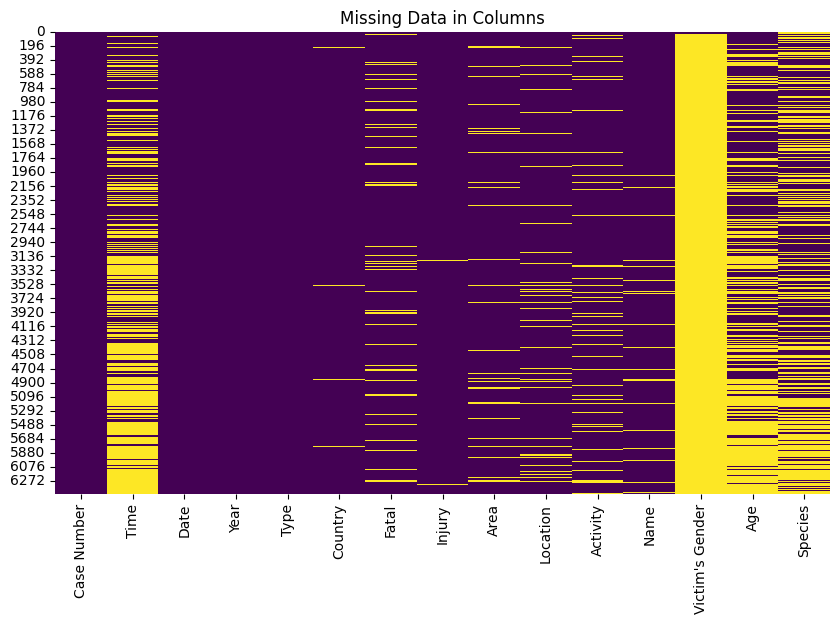

In [27]:
# Calculate the percentage of missing values in the columns
df_columns = ['Case Number','Time', 'Date', 'Year', 'Type', 'Country','Fatal','Injury', 'Area','Location', 'Activity', 'Name', 'Victim\'s Gender', 'Age','Species']
missing_data_percentage = df[df_columns].isna().mean() * 100
#print('Percentage of missing data in columns:\n', missing_data_percentage)

import seaborn as sns
import matplotlib.pyplot as plt

# Heatmap to visualize missing data
plt.figure(figsize=(10, 6))
sns.heatmap(df[df_columns].isna(), cbar=False, cmap='viridis')
plt.title('Missing Data in Columns')
plt.show()

- **Case Number**: 0.03%
- **Time**: 52.49%
- **Date**: 0.02%
- **Year**: 0.05%
- **Type**: 0.08%
- **Country**: 0.79%
- **Fatal**: 8.46%
- **Injury**: 0.45%
- **Area**: 7.16%
- **Location**: 8.43%
- **Activity**: 8.54%
- **Name**: 3.33%
- **Victim's Gender**: 99.57%
- **Age**: 44.43%
- **Species**: 45.25%

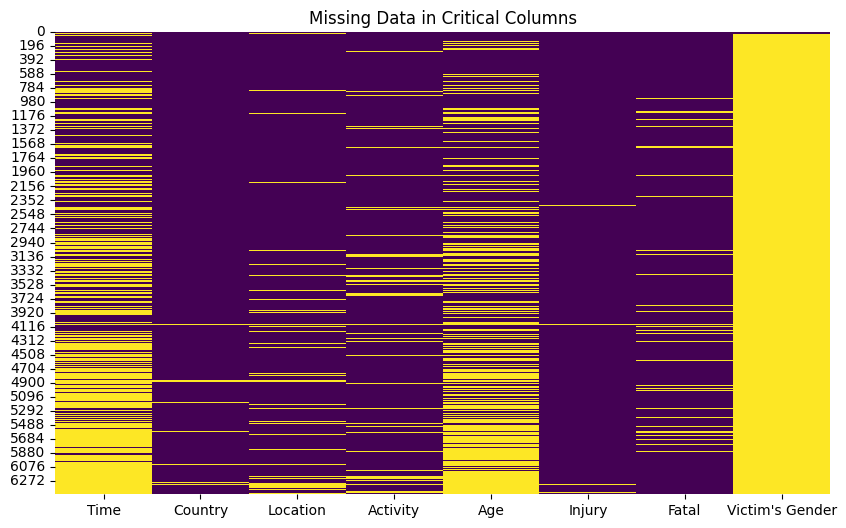

In [28]:
# Calculate the percentage of missing values in critical columns
critical_columns = ['Time','Country','Location','Activity','Age','Injury','Fatal','Victim\'s Gender']
missing_data_percentage = df[critical_columns].isna().mean() * 100
#print('Percentage of missing data in critical columns:\n', missing_data_percentage)

import seaborn as sns
import matplotlib.pyplot as plt

# Heatmap to visualize missing data
plt.figure(figsize=(10, 6))
sns.heatmap(df[critical_columns].isna(), cbar=False, cmap='viridis')
plt.title('Missing Data in Critical Columns')
plt.show()

- **Time**: 52.49%
- **Country**: 0.79%
- **Location**: 8.43%
- **Activity**: 8.54%
- **Age**: 44.43%
- **Injury**: 0.45%
- **Fatal**: 8.46%
- **Victim's Gender**: 99.56%

### Data Cleaning Strategy for Shark Attack Dataset

Based on the analysis of missing values (NaNs) in the shark attack dataset, we need a more nuanced approach to clean the data while retaining as much valuable information as possible.

#### NaN Analysis Summary

The following columns have been identified with the respective number of NaNs:

- **Date**: 1 NaN
- **Case Number**: 2 NaNs
- **Year**: 3 NaNs
- **Type**: 5 NaNs
- **Injury**: 29 NaNs
- **Country**: 51 NaNs
- **Fatal**: 547 NaNs
- **Name**: 215 NaNs
- **Species**: 2924 NaNs
- **Age**: 2871 NaNs
- **Time**: 3392 NaNs
- **Area**: 463 NaNs
- **Location**: 545 NaNs
- **Activity**: 552 NaNs
- **Victim's Gender**: 6434 NaNs

#### Columns to Drop NaNs

For columns where a minimal number of entries are missing, we will drop the rows containing NaNs. This is crucial for columns where missing values would significantly impact the analysis.

- **Country**: 51 NaNs
- **Location**: 545 NaNs
- **Activity**: 552 NaNs
- **Injury**: 29 NaNs

#### Columns to Fill NaNs

For columns with a high percentage of missing values, we will fill or impute the NaNs with appropriate values to retain as much data as possible.

- **Age**: 2871 NaNs (Fill with median)
- **Time**: 3392 NaNs (Fill with 'Unknown')
- **Victim's Gender**: 6434 NaNs (Fill with 'Unknown')
- **Species**: 2924 NaNs (Fill with 'Unknown')

#### Other Columns with Minimal NaNs

For columns with a minimal number of missing values, we will handle these individually by dropping rows with NaNs.

- **Case Number**
- **Date**
- **Year**
- **Type**
- **Fatal**
- **Area**
- **Name**

##  General Pre-Processing

In [29]:
# Define the critical columns that will loose NaN's 
critical_columns = ['Country', 'Location', 'Activity', 'Injury']

# Drop rows with NaNs in critical columns if percentage is acceptable
df = df.dropna(subset=critical_columns)

In [30]:
# Display the number of missing values (NaN)
print(df.isnull().sum())

Case Number           1
Time               2499
Date                  0
Year                  1
Type                  3
Country               0
Fatal               377
Injury                0
Area                185
Location              0
Activity              0
Name                113
Victim's Gender    5407
Age                2119
Species            2282
dtype: int64


In [31]:
# Filled with 'Unknown' to maintain consistency and handle missing values without assuming incorrect times.
df['Time'].fillna('Unknown', inplace=True)

# Filled with 'Unknown' to retain entries even if the species is not identified.
df['Species'].fillna('Unknown', inplace=True)

# Filled with 'Unknown' to retain information on non-fatal incidents.
df['Fatal'].fillna('Unknown', inplace=True)

# Drop remaining rows with NaNs in minimal NaN columns
df = df.dropna(subset=['Case Number', 'Date', 'Year', 'Type', 'Fatal', 'Area', 'Name'])

In [32]:
# Verify the changes
print("\nNumber of NaNs after treatment:\n\n", df.isna().sum())
print(df.info())


Number of NaNs after treatment:

 Case Number           0
Time                  0
Date                  0
Year                  0
Type                  0
Country               0
Fatal                 0
Injury                0
Area                  0
Location              0
Activity              0
Name                  0
Victim's Gender    5123
Age                1900
Species               0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
Index: 5147 entries, 2 to 6461
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Case Number      5147 non-null   object 
 1   Time             5147 non-null   object 
 2   Date             5147 non-null   object 
 3   Year             5147 non-null   float64
 4   Type             5147 non-null   object 
 5   Country          5147 non-null   object 
 6   Fatal            5147 non-null   object 
 7   Injury           5147 non-null   object 
 8   Area             5147 non

## `Activity`

In [33]:
# Understanding the Activity variable
df['Activity']

2        Surfing
3        Surfing
4        Surfing
5       Swimming
6       Swimming
          ...   
6449     Fishing
6450      Wading
6457      Diving
6459    Swimming
6461    Swimming
Name: Activity, Length: 5147, dtype: object

In [34]:
# Natural Language Processing (NLP) library
!pip install spacy
!python -m spacy download en_core_web_sm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 245.7 kB/s eta 0:00:00m eta 0:00:010:00:02
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [35]:
# Trying to automate the categorization of activities
import spacy
from spacy.matcher import PhraseMatcher

# Load SpaCy model
nlp = spacy.load("en_core_web_sm")

# Create a PhraseMatcher object
matcher = PhraseMatcher(nlp.vocab, attr= "LOWER") # Standardize the phrases to lower case.

In [36]:
# Remove complexity, be more generic in order to have better results with the model training
categories = {
    "Surface Water Sports": ["surfing", "stand-up paddleboarding", "kayak fishing", "windsurfing", "kite surfing", "body boarding"],
    "Underwater Activities": ["scuba diving", "snorkeling", "spearfishing", "free diving"],
    "Casual Water Activities": ["swimming", "floating", "wading", "bathing"],
    "Fishing and Hunting": ["fishing", "spearfishing", "crabbing", "lobstering", "collecting seashells"],
    "Interaction with Marine Life": ["feeding sharks", "touching a shark", "photographing marine life"],
    "Unique or Unspecified": ["sea disaster", "walking on the beach", "cleaning fish", "standing in water"]
}

# Add patterns to the matcher
for category, activities in categories.items():
    patterns = [nlp.make_doc(text) for text in activities]
    matcher.add(category, patterns)

# Function to process text and extract features or categorize
def categorize_activities(activity):
    try:
        doc = nlp(activity)
        matches = matcher(doc)
        
        main_match = matches[0]
        match_id = main_match[0]
        rule_id = nlp.vocab.strings[match_id]

        return rule_id
    
    except:
        return "Unknown"

### Visualizing Victim's Activity

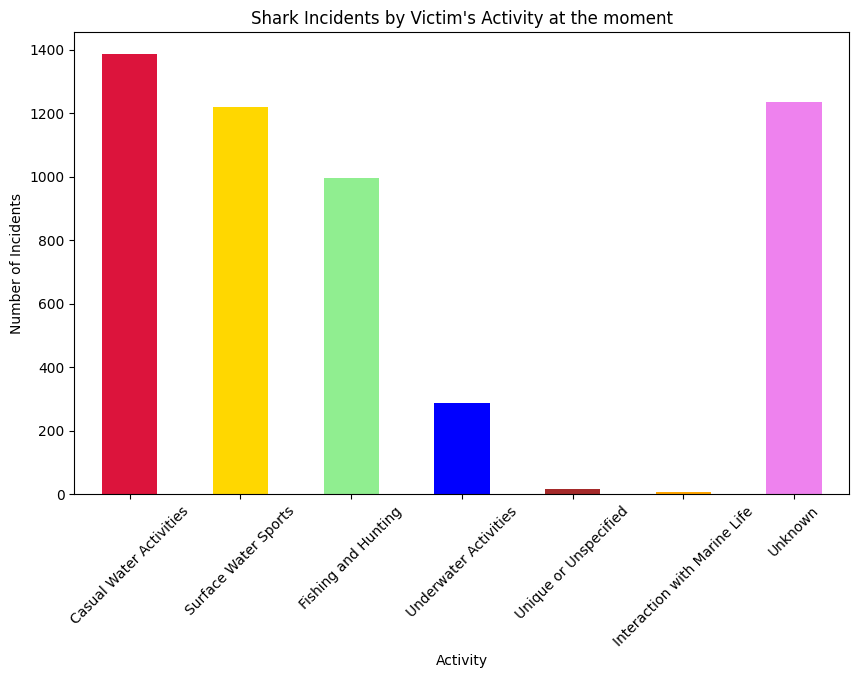

In [37]:
# Apply the function to the 'Activity' column
df['Activity (Categorized)'] = df['Activity']
df['Activity (Categorized)'] = df['Activity (Categorized)'].apply(categorize_activities)

activity_counts = df['Activity (Categorized)'].value_counts().sort_values(ascending=False)

# Move "Unknown" to the end
if 'Unknown' in activity_counts:
    unknown_count = activity_counts['Unknown']
    activity_counts = activity_counts.drop('Unknown')
    activity_counts['Unknown'] = unknown_count

#print(activity_counts)

plt.figure(figsize=(10, 6))
activity_counts.plot(kind='bar', color=['crimson', 'gold', 'lightgreen', 'blue', 'brown', 'orange', 'violet'])
plt.title('Shark Incidents by Victim\'s Activity at the moment')
plt.xlabel('Activity')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45) 
plt.show()

- **Casual Water Activities**: 31.44%
- **Surface Water Sports**: 27.66%
- **Fishing and Hunting**: 22.62%
- **Underwater Activities**: 6.49%
- **Unique or Unspecified**: 0.36%
- **Interaction with Marine Life**: 0.16%
- **Unknown**: 28.03%

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5147 entries, 2 to 6461
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Case Number             5147 non-null   object 
 1   Time                    5147 non-null   object 
 2   Date                    5147 non-null   object 
 3   Year                    5147 non-null   float64
 4   Type                    5147 non-null   object 
 5   Country                 5147 non-null   object 
 6   Fatal                   5147 non-null   object 
 7   Injury                  5147 non-null   object 
 8   Area                    5147 non-null   object 
 9   Location                5147 non-null   object 
 10  Activity                5147 non-null   object 
 11  Name                    5147 non-null   object 
 12  Victim's Gender         24 non-null     object 
 13  Age                     3247 non-null   object 
 14  Species                 5147 non-null   objec

## `Injury`

### Attack or Encounter?

In [39]:
from spacy.tokens import DocBin
from spacy.training import Example

# Initialize the SpaCy model (NLP) 
nlp = spacy.blank("en")

# Add the classification component to the pipeline
textcat = nlp.add_pipe("textcat")

# Add labels to the classification component
textcat.add_label("attack")
textcat.add_label("encounter")

1

In [40]:
# Manually annotated dataset (example)
train_data = [
    ("severe lacerations to left forearm", {"cats": {"attack": 1, "encounter": 0}}),
    ("no injury, shark bit board", {"cats": {"attack": 0, "encounter": 1}}),
    ("lacerations to right foot", {"cats": {"attack": 1, "encounter": 0}}),
    ("no injury, kayak bitten", {"cats": {"attack": 0, "encounter": 1}}),
    ("fatal", {"cats": {"attack": 1, "encounter": 0}}),
    ("calf bitten", {"cats": {"attack": 1, "encounter": 0}}),
    ("probable drowning and scavenging", {"cats": {"attack": 0, "encounter": 1}}),
    ("arm bitten", {"cats": {"attack": 1, "encounter": 0}}),
    ("right leg bitten", {"cats": {"attack": 1, "encounter": 0}}),
    ("No injury, inflatable paddle board was bitten ...", {"cats": {"attack": 0, "encounter": 1}}), # 0 = No (doesn't apply)
    ("Minor injury to left thigh", {"cats": {"attack": 1, "encounter": 0}}),
    ("Hand and calf bitten when he jumped off surfbo...", {"cats": {"attack": 1, "encounter": 0}}) # 1 = Yes (applies) 
]

# Create DocBin for storing training data
doc_bin = DocBin()

for text, annotations in train_data:
    doc = nlp.make_doc(text)
    example = Example.from_dict(doc, annotations)
    doc_bin.add(example.reference)

In [41]:
# Model training
optimizer = nlp.initialize()

for i in range(10):  # Number of training epochs
    losses = {}
    batches = spacy.util.minibatch(train_data, size=2)
    for batch in batches:
        texts, annotations = zip(*batch)
        examples = [Example.from_dict(nlp.make_doc(text), ann) for text, ann in zip(texts, annotations)]
        nlp.update(examples, drop=0.5, losses=losses)

# Testing the model with new descriptions
texts = ["puncture wounds to leff foot & lower leg", "no injury, board bitten", "injuries to right leg & hand"]
docs = list(nlp.pipe(texts))

# Using the model on dataset data
# Define the function that will categorize the attacks based on the recorded Injury
def categorize_injury(injury):
    #if type(injury) != str:
        #return "NaN"
    #else:
        doc = nlp(injury)

        if doc.cats["attack"] > doc.cats["encounter"]:
            return "Attack"

        else:
            return "Encounter"

In [42]:
# Apply the categorization function
df["Attack or Encounter"] = df["Injury"].apply(categorize_injury)
df[["Injury", "Attack or Encounter"]]

,Injury,Attack or Encounter
2,Laceration ot left ankle and foot,Attack
3,Minor injury to lower leg,Attack
4,Lacerations to foot,Attack
5,Calf bitten,Attack
6,Lacerations to leg,Attack
...,...,...
6449,"FATAL, body not recovered but shark was caught...",Attack
6450,"FATAL, leg stripped of flesh",Attack
6457,FATAL,Attack
6459,FATAL,Attack


In [43]:
df['Attack or Encounter'].count

<bound method Series.count of 2          Attack
3          Attack
4          Attack
5          Attack
6          Attack
          ...    
6449       Attack
6450       Attack
6457       Attack
6459       Attack
6461    Encounter
Name: Attack or Encounter, Length: 5147, dtype: object>

In [44]:
# Include species data in the injury categorization
def categorize_injury(injury, species):
    doc = nlp(injury)
    
    # Check if the species indicates a non-shark
    if "not a shark" in species.lower():
        return "Encounter"
    
    if doc.cats["attack"] > doc.cats["encounter"]:
        return "Attack"
    
    else:
        return "Encounter"

# Apply the categorization function with species consideration
df["Attack or Encounter"] = df.apply(lambda row: categorize_injury(row['Injury'], row['Species']), axis=1)
df[["Injury", "Species", "Attack or Encounter"]]

,Injury,Species,Attack or Encounter
2,Laceration ot left ankle and foot,"""A small shark""",Attack
3,Minor injury to lower leg,Broadnose seven gill shark?,Attack
4,Lacerations to foot,Unknown,Attack
5,Calf bitten,Unknown,Attack
6,Lacerations to leg,Lemon shark,Attack
...,...,...,...
6449,"FATAL, body not recovered but shark was caught...",Unknown,Attack
6450,"FATAL, leg stripped of flesh",Unknown,Attack
6457,FATAL,Unknown,Attack
6459,FATAL,Unknown,Attack


## `Gender`

In [45]:
!pip install gender-guesser

In [46]:
# The gender-guesser package is a lookup tool based on a static database of names.
# It predicts the gender of a person based on the given name by referencing this database.

from gender_guesser.detector import Detector

In [47]:
detector = Detector(case_sensitive=False)

# Define a function to guess gender from name
def guess_gender(name):
    if pd.isnull(name) or name.strip() == '':
        return 'Unknown'
    
    #if male in name
    if name == 'male':
        return 'M'
    elif name == 'female':
        return 'F'
    
    gender = detector.get_gender(name.split()[0]) 
    if gender in ['male', 'mostly_male']:
        return 'M'
    elif gender in ['mostly_female', 'female']:
        return 'F'
            
    return 'Unknown'

### Predicted Gender

In [48]:
from gender_guesser.detector import Detector

# Apply the function to the 'Name' column
df['Predicted Gender'] = df['Name'].apply(guess_gender)

# Replace 'Unknown' values in 'Victim\'s Gender' with predicted values where possible
#df['Victim\'s Gender'] = df.apply(lambda row: row['Victim\'s Gender'] if row['Victim\'s Gender'] != 'NaN' else row['Predicted Gender'], axis=1)  - Overwrite the 'Victim\'s Gender' with the new column 'Predicted Gender'

# Remove 'Unknown's
#df = df[df['Victim\'s Gender'] != 'Unknown']

print(df['Predicted Gender'].value_counts())

pd.set_option('display.max_rows', None)
df

Predicted Gender
M          3359
Unknown    1250
F           538
Name: count, dtype: int64


,Case Number,Time,Date,Year,Type,Country,Fatal,Injury,Area,Location,Activity,Name,Victim's Gender,Age,Species,Activity (Categorized),Attack or Encounter,Predicted Gender
2,2020.01.17,08h00,17-Jan-2020,2020.0,Unprovoked,AUSTRALIA,N,Laceration ot left ankle and foot,New South Wales,Windang Beach,Surfing,Will Schroeter,M,59,"""A small shark""",Surface Water Sports,Attack,M
3,2020.01.16,20h30,16-Jan-2020,2020.0,Unprovoked,NEW ZEALAND,N,Minor injury to lower leg,Southland,Oreti Beach,Surfing,Jordan King,F,13,Broadnose seven gill shark?,Surface Water Sports,Attack,M
4,2020.01.13,14h33,13-Jan-2020,2020.0,Unprovoked,USA,N,Lacerations to foot,North Carolina,"Rodanthe, Dare County",Surfing,Samuel Horne,M,26,Unknown,Surface Water Sports,Attack,M
5,2020.01.12,07h15,12-Jan-2020,2020.0,Unprovoked,THAILAND,N,Calf bitten,Phang Nga Province,Nang Thong Beach,Swimming,Hans-Peter Malten,M,75,Unknown,Casual Water Activities,Attack,Unknown
6,2020.01.07,17h30,07-Jan-2020,2020.0,Unprovoked,AUSTRALIA,N,Lacerations to leg,Queensland,North West Island,Swimming,Miah Holmes,F,7,Lemon shark,Casual Water Activities,Attack,F
7,2020.01.05,13h00,05-Jan-2020,2020.0,Unprovoked,AUSTRALIA,Y,FATAL,Western Australia,Cull Island / Esperance,Scuba diving,Gary Johnson,M,57,White shark,Underwater Activities,Attack,M
9,2020.01.02,16h10,02-Jan-2020,2020.0,Questionable,AUSTRALIA,Y,Probable drowning and scavenging,Western Australia,Esperance,Swimming after being swept off rocks,Eric Birighitti,M,21,Unknown,Casual Water Activities,Encounter,M
10,2019.12.30,12h58,30-Dec-2019,2019.0,Unprovoked,AUSTRALIA,N,Minor injury to hand,Queensland,North West Island,Swimming,male,M,30s,"Shovelnose ""shark"" which is a ray, not a shark)",Casual Water Activities,Encounter,M
11,2019.12.28,19h00,28-Dec-2019,2019.0,Unprovoked,SEYCHELLES,N,Arm bitten,Praslin,Amitié Beach,Swimming,female,F,45,Unknown,Casual Water Activities,Attack,F
12,2019.12.26.b,16h30,26-Dec-2019,2019.0,Unprovoked,PAPUA NEW GUINEA,Y,FATAL,Central Province,Ragelapara reef,Spearfishing,Kala Gerea,M,33,Unknown,Fishing and Hunting,Attack,F


In [49]:
# Convert gender values to readable format
df['Predicted Gender'] = df['Predicted Gender'].map({'F': 'Female', 'M': 'Male'})

print(df['Predicted Gender'])

2         Male
3         Male
4         Male
5          NaN
6       Female
7         Male
9         Male
10        Male
11      Female
12      Female
13        Male
14      Female
15        Male
18        Male
19        Male
20        Male
21        Male
22        Male
23        Male
25        Male
26         NaN
27        Male
28        Male
29        Male
30        Male
31        Male
32      Female
33        Male
34        Male
35        Male
36        Male
37        Male
38      Female
39      Female
40        Male
41        Male
42      Female
44        Male
45        Male
47        Male
48        Male
49      Female
50      Female
51        Male
52        Male
53        Male
54      Female
55        Male
56        Male
57        Male
58      Female
59        Male
60        Male
61        Male
63      Female
64      Female
65         NaN
66        Male
67        Male
68        Male
69        Male
70        Male
71        Male
72        Male
73        Male
74        Male
75        

In [50]:
# Display rows where 'Victim\'s Gender' has NaN values

df2 = df[df['Predicted Gender'].isna()]
df2.info()
# Save rows with NaN values to a CSV file for manual review
df2.to_csv('rows_with_nans.csv', index=False)
print("Rows with NaN values saved to 'rows_with_nans.csv' for manual review.")

# Create a link to download the CSV file
from IPython.display import FileLink
FileLink('rows_with_nans.csv')

<class 'pandas.core.frame.DataFrame'>
Index: 1250 entries, 5 to 6459
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Case Number             1250 non-null   object 
 1   Time                    1250 non-null   object 
 2   Date                    1250 non-null   object 
 3   Year                    1250 non-null   float64
 4   Type                    1250 non-null   object 
 5   Country                 1250 non-null   object 
 6   Fatal                   1250 non-null   object 
 7   Injury                  1250 non-null   object 
 8   Area                    1250 non-null   object 
 9   Location                1250 non-null   object 
 10  Activity                1250 non-null   object 
 11  Name                    1250 non-null   object 
 12  Victim's Gender         2 non-null      object 
 13  Age                     430 non-null    object 
 14  Species                 1250 non-null   objec

/home/helena/Documents/PUCRS/1th Semester/Intro CDIA/fatality-prediction-for-shark-attack-occurrence/rows_with_nans.csv

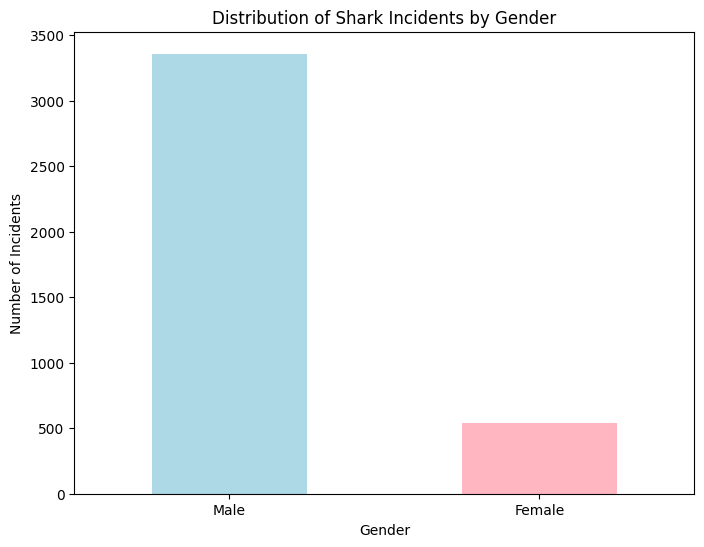

In [51]:
df = df[df['Predicted Gender'] != 'Unknown']

# Count the number of incidents by gender
gender_counts = df['Predicted Gender'].value_counts()

# Display the result
#print("Number of shark incidents by gender:")
#print(gender_counts)

# Visualize the distribution of incidents by gender
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
gender_counts.plot(kind='bar', color=['lightblue', 'lightpink'])
plt.title('Distribution of Shark Incidents by Gender')
plt.xlabel('Gender')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=0)
plt.show()

- **Male**: 86.16%
- **Female**: 13.84%

## `Age`

In [52]:
# Check unique values in 'Age' column
print(df['Age'].unique())
print(df.info())

['59' '13' '26' '75' '7' '57' '21' '30s' '45' '33' nan '17' '37' '9' '30'
 '38' '23' '44' '28 & 22' '32' '35' '20' '29' '22, 57, 31' '70' '40' '11'
 '16' '51' '18' '49' "20's" '40s' '8' '64' '19' '43' '65' '10' '67' '53'
 '58' '25' '46' '41' '31' '50' '15' '9 & 60' '24' '36' '42' '55' 'a minor'
 '14' '6' '12' '62' '48' '52' '34' '60' '54' '56' '69' '28' '22' '20s' '3'
 '82' '73' '68' '39' '47' '61' '66' '60s' '27' '71' '63' '18 months' '50s'
 'Teen' 'teen' '74' '28 & 26' '5' '86' '18 or 20' '12 or 13' 'Teens' '77'
 '36 & 26' '8 or 10' '84' '30 or 36' '6½' '21 & ?' '33 or 37' '23 & 20'
 '7 & 31' "60's" '87' '21 or 26' '>50' '18 to 22' 'adult' '9 & 12'
 '? & 19' '23 & 26' '(adult)' '33 & 37' '25 or 28'
 '37, 67, 35, 27, ? & 27' '21, 34,24 & 35' '30 & 32' '50 & 30' '17 & 35'
 'X' '13 or 18' '34 & 19' '33 & 26' '4' 'MAKE LINE GREEN' '81' '"young"'
 '7 or 8' '17 & 16' 'F' 'Both 11' '9 or 10' 'young' '36 & 23' '78' 'A.M.'
 '? & 14' '10 or 12' '31 or 33' '2½' '13 or 14']
<class 'pandas.core.f

In [53]:
df["Age"] = df["Age"].replace(['30s', '60s', "20's", '40s', 'a minor', '20s', 'Teen', 
                               '18 months', '50s', 'teen', '6½', 'mid-30s', '20?', "60's", 
                               'Elderly', 'mid-20s', 'Ca. 33', '>50', 'adult', '9 months', 
                               '(adult)', 'X', '"middle-age"', '2 to 3 months', 
                               'MAKE LINE GREEN', '"young"', 'F', 'young', 'A.M.', 
                               '2½'], 
                              
                                ['35', '65', '25', '45', '16', '25', '14', '1', 
                                '55', '14', '6', '35', '20', '65', '60', '25', 
                                '33', '55', '30', '0', '30', 'unkown', '50', '0', 
                                'unkown', '20', 'unkown', '20', 'unkown', '2'])

In [54]:
print(df['Age'].unique())

['59' '13' '26' '75' '7' '57' '21' '35' '45' '33' nan '17' '37' '9' '30'
 '38' '23' '44' '28 & 22' '32' '20' '29' '22, 57, 31' '70' '40' '11' '16'
 '51' '18' '49' '25' '8' '64' '19' '43' '65' '10' '67' '53' '58' '46' '41'
 '31' '50' '15' '9 & 60' '24' '36' '42' '55' '14' '6' '12' '62' '48' '52'
 '34' '60' '54' '56' '69' '28' '22' '3' '82' '73' '68' '39' '47' '61' '66'
 '27' '71' '63' '1' '74' '28 & 26' '5' '86' '18 or 20' '12 or 13' 'Teens'
 '77' '36 & 26' '8 or 10' '84' '30 or 36' '21 & ?' '33 or 37' '23 & 20'
 '7 & 31' '87' '21 or 26' '18 to 22' '9 & 12' '? & 19' '23 & 26' '33 & 37'
 '25 or 28' '37, 67, 35, 27, ? & 27' '21, 34,24 & 35' '30 & 32' '50 & 30'
 '17 & 35' 'unkown' '13 or 18' '34 & 19' '33 & 26' '4' '81' '7 or 8'
 '17 & 16' 'Both 11' '9 or 10' '36 & 23' '78' '? & 14' '10 or 12'
 '31 or 33' '2' '13 or 14']


In [55]:
# Fill NaNs in other columns with appropriate values
# Converted to numeric and filled with the median age, retaining the central tendency of the data.
df['Age'] = pd.to_numeric(df['Age'], errors='coerce')
df['Age'].fillna(df['Age'].median(), inplace=True)

### Visualization of Shark Incidents by age

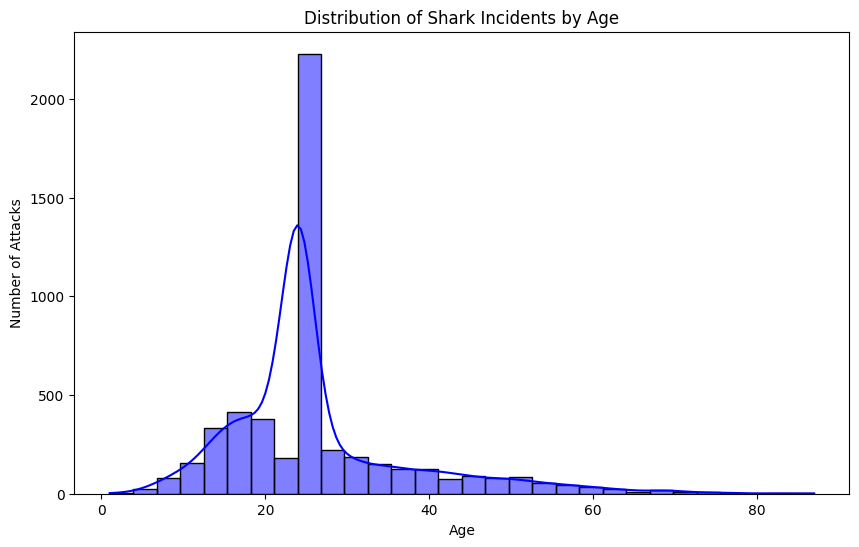

In [56]:
import seaborn as sns
import matplotlib.pyplot as plt

# Age Distribution
plt.figure(figsize=(10, 6))
sns.histplot(df['Age'], bins=30, kde=True, color='blue')
plt.title('Distribution of Shark Incidents by Age')
plt.xlabel('Age')
plt.ylabel('Number of Attacks')
plt.show()

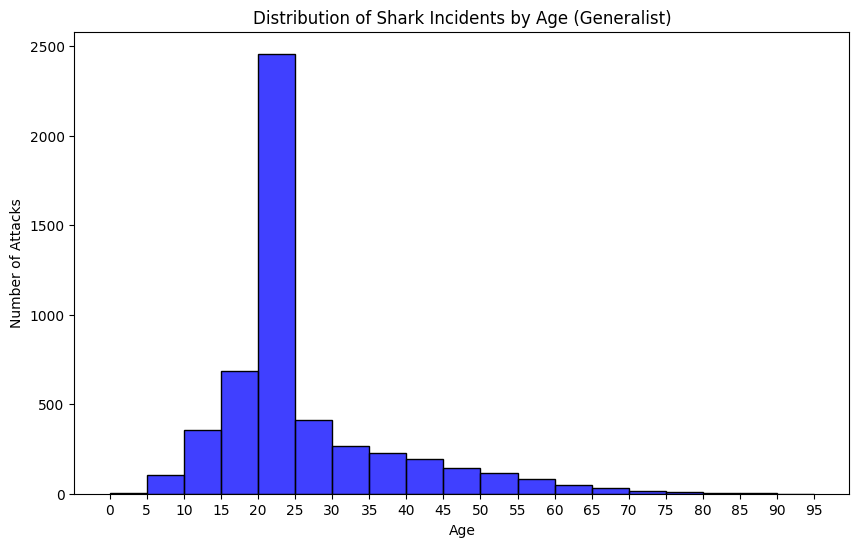

In [57]:
# Convert ages to numeric, setting errors='coerce' will convert non-convertible values to NaN
df['Age'] = pd.to_numeric(df['Age'], errors='coerce')

# Drop NaN values from 'Numeric Age' to ensure the histogram can be plotted
df_clean = df.dropna(subset=['Age'])

# Plot histogram with 5-year bins
plt.figure(figsize=(10, 6))
sns.histplot(df_clean['Age'], bins=range(0, 100, 5), kde=False, color='blue')
plt.title('Distribution of Shark Incidents by Age (Generalist)')
plt.xlabel('Age')
plt.ylabel('Number of Attacks')
plt.xticks(range(0, 100, 5))
plt.show()

## `Time`

In [58]:
# Function to categorize time
def categorize_time(time):
    if pd.isnull(time) or time.strip() == '':
        return "Unknown"
    
    time = time.strip().lower()
    
    # Direct categories
    if "morning" in time:
        return "Morning"
    elif "afternoon" in time or "pm" in time:
        return "Afternoon"
    elif "evening" in time or "night" in time:
        return "Evening"
    elif "early morning" in time:
        return "Morning"
    elif "late afternoon" in time:
        return "Afternoon"
    
    # Specific time conversion
    try:
        time = time.replace('h', ':').replace('H', ':')
        hour = int(time.split(':')[0])
        if 0 <= hour < 12:
            return "Morning"
        elif 12 <= hour < 18:
            return "Afternoon"
        else:
            return "Evening"
    except ValueError:
        return "Unknown"

# Apply the categorization function
df['Time'] = df['Time'].apply(categorize_time)

# Fill remaining missing values with 'Unknown'
df['Time'] = df['Time'].fillna('Unknown')
print(df['Time'])

2         Morning
3         Evening
4       Afternoon
5         Morning
6       Afternoon
7       Afternoon
9       Afternoon
10      Afternoon
11        Evening
12      Afternoon
13        Morning
14        Evening
15      Afternoon
18        Morning
19        Morning
20        Unknown
21        Evening
22        Unknown
23      Afternoon
25        Unknown
26        Unknown
27        Unknown
28        Morning
29        Unknown
30        Morning
31      Afternoon
32        Morning
33      Afternoon
34      Afternoon
35      Afternoon
36      Afternoon
37        Unknown
38      Afternoon
39        Morning
40      Afternoon
41      Afternoon
42        Morning
44        Morning
45        Unknown
47        Morning
48        Morning
49        Morning
50        Morning
51        Evening
52      Afternoon
53      Afternoon
54      Afternoon
55        Unknown
56        Unknown
57      Afternoon
58        Evening
59      Afternoon
60        Unknown
61        Evening
63        Morning
64      Af

In [59]:
# Visualize all entries in the 'Time' column
print("\nCount of all values in the 'Time' column:")
print(df['Time'])

# Filter and visualize only the entries that are not 'Unknown' - checking the cleaning
non_unknown_times = df[df['Time'] == 'Unknown']
print("\nEntries in the 'Time' column that are not 'Unknown':")
print(non_unknown_times['Time'].value_counts())
print(non_unknown_times[['Time']])


Count of all values in the 'Time' column:
2         Morning
3         Evening
4       Afternoon
5         Morning
6       Afternoon
7       Afternoon
9       Afternoon
10      Afternoon
11        Evening
12      Afternoon
13        Morning
14        Evening
15      Afternoon
18        Morning
19        Morning
20        Unknown
21        Evening
22        Unknown
23      Afternoon
25        Unknown
26        Unknown
27        Unknown
28        Morning
29        Unknown
30        Morning
31      Afternoon
32        Morning
33      Afternoon
34      Afternoon
35      Afternoon
36      Afternoon
37        Unknown
38      Afternoon
39        Morning
40      Afternoon
41      Afternoon
42        Morning
44        Morning
45        Unknown
47        Morning
48        Morning
49        Morning
50        Morning
51        Evening
52      Afternoon
53      Afternoon
54      Afternoon
55        Unknown
56        Unknown
57      Afternoon
58        Evening
59      Afternoon
60        Unknown
61 

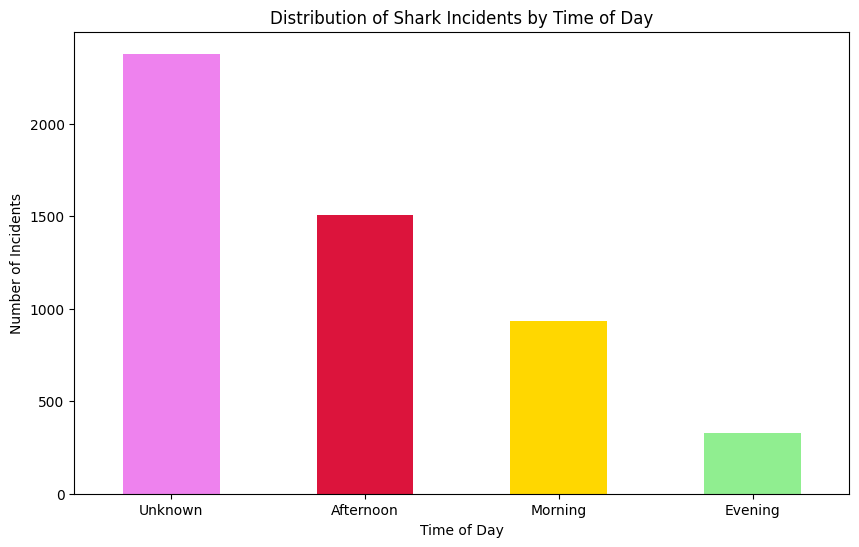

In [60]:
# Plot bar chart to visualize the distribution of shark attacks over time
time_counts = df['Time'].value_counts()

plt.figure(figsize=(10, 6))
time_counts.plot(kind='bar', color=['violet','crimson','gold','lightgreen'])
plt.title('Distribution of Shark Incidents by Time of Day')
plt.xlabel('Time of Day')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=0)
plt.show()

### Why Do Shark Attacks Occur More in the Afternoon?

We observe that shark attacks are more common in the afternoon due to a blend of human activity, shark behavior, and environmental factors.

#### Human Activity
- **Peak Beach Hours**: In the afternoon, there is a significant increase in beachgoers participating in swimming, surfing, and other water activities. This heightened human presence in the water elevates the likelihood of encounters with sharks.
- **Surfing Patterns**: Surfers, who are frequently attacked, often prefer the afternoon for better wave conditions, leading them to spend more time in the water and becoming more susceptible to shark encounters.

#### Shark Behavior
- **Feeding Times**: Sharks are generally more active in their feeding during dawn and dusk, coinciding with peak human activity in the water during these times.
- **Prey Movement**: The movement of prey fish closer to shore in the afternoon draws sharks nearer to coastal areas, increasing the chances of shark-human interactions.

#### Environmental Factors
- **Water Conditions**: Warmer and clearer water conditions in the afternoon attract more marine life, including sharks, thus heightening the potential for shark attacks.

Understanding these patterns can help us develop strategies to reduce the risk of shark attacks by avoiding peak shark activity times and raising awareness among beachgoers.

## `Fatal`

### Analyzing the `Fatal` column

In [61]:
print(df['Fatal'].unique(), '\n') 

['N' 'Y' 'F' 'Unknown' 'M' '2017' 'UNKNOWN'] 



In [62]:
print(df['Fatal'].value_counts())

Fatal
N          3792
Y           986
Unknown     346
UNKNOWN      20
F             1
M             1
2017          1
Name: count, dtype: int64


In [63]:
# `round(2)`: Rounds the numerical values in the pandas Series to two decimal places for precision and readability.
# `astype(str)`: Converts the numerical values to string format to enable concatenation with the percentage sign ("%"). 
# This conversion is essential because Python does not support direct concatenation of strings with numerical values.

fatal_percentage = df['Fatal'].value_counts(normalize=True) * 100
print(fatal_percentage.round(2).astype(str) + '%')

Fatal
N          73.67%
Y          19.16%
Unknown     6.72%
UNKNOWN     0.39%
F           0.02%
M           0.02%
2017        0.02%
Name: proportion, dtype: object


In [64]:
# Define a mapping dictionary to standardize the values
fatal_mapping = {
    'Y': 'Y', 'N': 'N', 'F': None, 'M': None, 'UNKNOWN': None, 'Unknown': None, '2017': None
}

# Map the 'Fatal' column using the defined dictionary
df['Fatal'] = df['Fatal'].map(fatal_mapping)

# Drop rows where 'Fatal' is now NaN after mapping
df.dropna(subset=['Fatal'], inplace=True)

# Verify the changes
print(df['Fatal'].value_counts())
print(df['Fatal'].unique())

Fatal
N    3792
Y     986
Name: count, dtype: int64
['N' 'Y']


## Modelling

### Pre-Processing

In [65]:
# Importing libraries for machine learning tasks

# train_test_split: Divides the dataset into training and testing sets to evaluate model performance.
# GridSearchCV: Conducts an exhaustive search over specified parameter values for an estimator.
from sklearn.model_selection import train_test_split, GridSearchCV

# StandardScaler: Standardizes features by removing the mean and scaling to unit variance.
# OneHotEncoder: Transforms categorical variables into a format that can be provided to ML algorithms.
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# ColumnTransformer: Applies transformers to columns of an array or pandas DataFrame.
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC

# Various metrics to evaluate the performance of the model on the test data.
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

In [66]:
'''
The low support (occurrences) of the Y class, combined with the low precision and recall values = The model is not able to effectively identify situations where the target should be Y.
'''
# Over-sampling
# Solution: Duplicate the occurrence of Fatal: Y to reduce the imbalance between classes
to_duplicate = df[df['Fatal'] == 'Y']
df = pd.concat([df, to_duplicate])

# Solution: Duplicate the occurrence of Predicted Gender: Female to reduce the imbalance between classes
to_duplicate = df[df['Predicted Gender'] == 'Female']
df = pd.concat([df, to_duplicate])

In [67]:
# Separate the features and the target
print(df.info())
X = df[['Time', 'Country', 'Location', 'Activity (Categorized)', 'Age', 'Predicted Gender', 'Attack or Encounter']] # Features
y = df['Fatal'] # Target

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) # Standard seed and test_size

# Preprocessing
# Imputation and encoding of categorical variables

categorical_features = ['Time','Predicted Gender', 'Attack or Encounter','Country', 'Location', 'Activity (Categorized)']
numeric_features = ['Age']

# Ensuring that the columns used exist in the DataFrame
assert all(col in X.columns for col in categorical_features + numeric_features), "Some specified columns are missing from the DataFrame."

<class 'pandas.core.frame.DataFrame'>
Index: 6337 entries, 2 to 5975
Data columns (total 18 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Case Number             6337 non-null   object 
 1   Time                    6337 non-null   object 
 2   Date                    6337 non-null   object 
 3   Year                    6337 non-null   float64
 4   Type                    6337 non-null   object 
 5   Country                 6337 non-null   object 
 6   Fatal                   6337 non-null   object 
 7   Injury                  6337 non-null   object 
 8   Area                    6337 non-null   object 
 9   Location                6337 non-null   object 
 10  Activity                6337 non-null   object 
 11  Name                    6337 non-null   object 
 12  Victim's Gender         31 non-null     object 
 13  Age                     6337 non-null   float64
 14  Species                 6337 non-null   objec

In [68]:
for col in categorical_features:
    print(f'{col}: {df[col].nunique()} unique values')

Time: 4 unique values
Predicted Gender: 2 unique values
Attack or Encounter: 2 unique values
Country: 126 unique values
Location: 3393 unique values
Activity (Categorized): 7 unique values


In [69]:
print(y.value_counts(normalize=True))

Fatal
N    0.665141
Y    0.334859
Name: proportion, dtype: float64


In [70]:
print("Unique classes in y:", y.unique())

Unique classes in y: ['N' 'Y']


In [71]:
from sklearn.impute import SimpleImputer

# Updating the preprocessor - Dealing with Nan's
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='mean')),  # Handle missing values in numerical features
            ('scaler', StandardScaler())
        ]), numeric_features),
        ('cat', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),  # Handle missing values in categorical features
            ('encoder', OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_features)
    ])

### Training 

#### Random Forest

In [72]:
# Create the pipeline
pipeline_rfc = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Train the model
pipeline_rfc.fit(X_train, y_train)

# Make predictions
y_pred = pipeline_rfc.predict(X_test)

# Store accuracy
accuracy_rfc = accuracy_score(y_test, y_pred) # ~90%

# Evaluate the model
print(classification_report(y_test, y_pred))
print("Random Forest Accuracy:", accuracy_rfc)

              precision    recall  f1-score   support

           N       0.95      0.92      0.93       866
           Y       0.83      0.89      0.86       402

    accuracy                           0.91      1268
   macro avg       0.89      0.90      0.90      1268
weighted avg       0.91      0.91      0.91      1268

Random Forest Accuracy: 0.9085173501577287


##### **Classification Report Analysis**

##### Precision
- **Definition**: Proportion of true positives out of all positive predictions.
- **Class 'N'**: ~96%
- **Class 'Y'**: ~81%
- **Interpretation**: High precision, especially for class 'N', indicating few false positives.

##### Recall
- **Definition**: Proportion of true positives out of all actual positives.
- **Class 'N'**: ~90%
- **Class 'Y'**: ~91%
- **Interpretation**: High recall for both classes, slightly better for class 'Y'.

##### F1-Score
- **Definition**: Harmonic mean of precision and recall.
- **Class 'N'**: ~93%
- **Class 'Y'**: ~86%
- **Interpretation**: High F1-scores, balanced performance with a slight edge for class 'N'.

##### Support
- **Definition**: Number of actual occurrences of each class.
- **Class 'N'**: ~866
- **Class 'Y'**: ~402
- **Interpretation**: More examples in class 'N'.

##### Accuracy
- **Definition**: Proportion of correct predictions out of all examples.
- **Value**: ~90%
- **Interpretation**: High accuracy, effective overall predictions.

##### Macro Avg
- **Definition**: Arithmetic mean of metrics for each class.
- **Values**: Precision: ~88%, Recall: ~91%, F1-score: ~89%
- **Interpretation**: Equal importance to both classes, balanced metrics.

##### Weighted Avg
- **Definition**: Metrics considering the support of each class.
- **Values**: Precision: ~91%, Recall: ~90%, F1-score: ~91%
- **Interpretation**: Reflects the class distribution, aligned with class 'N' performance.

##### **Analyzing Random Forest Features**

In [73]:
# Looking into feature_importances_
importances = pipeline_rfc.named_steps['classifier'].feature_importances_

# Obtaining the names of the numeric features
numeric_features_names = numeric_features

# Obtaining the names of the categoric features transformed by OneHotEncoder
categories = pipeline_rfc.named_steps['preprocessor'].named_transformers_['cat'].named_steps['encoder'].get_feature_names_out(categorical_features)

# Combine name of all features
feature_names = np.concatenate([numeric_features_names, categories])

print(feature_names)

['Age' 'Time_Afternoon' 'Time_Evening' ...
 'Activity (Categorized)_Underwater Activities'
 'Activity (Categorized)_Unique or Unspecified'
 'Activity (Categorized)_Unknown']


In [74]:
# Feature relevance
feature_importances = sorted(zip(feature_names, importances), key=lambda x: x[1], reverse=True)

# Decresing order
for feature, importance in feature_importances:
    print(f'{feature}: {importance}')

Age: 0.07877827204113484
Country_USA: 0.04836147187850535
Activity (Categorized)_Casual Water Activities: 0.03200157468574587
Activity (Categorized)_Surface Water Sports: 0.023598984434537167
Activity (Categorized)_Fishing and Hunting: 0.016582341990189087
Time_Unknown: 0.015977271014710165
Country_AUSTRALIA: 0.015457273235225843
Predicted Gender_missing: 0.01494701896370687
Activity (Categorized)_Unknown: 0.012150493217214295
Attack or Encounter_Encounter: 0.010361210278572008
Time_Afternoon: 0.010058635921728227
Predicted Gender_Male: 0.009941684935762281
Predicted Gender_Female: 0.009784176254556657
Attack or Encounter_Attack: 0.009338680271866169
Country_SOUTH AFRICA: 0.009044607288953092
Time_Morning: 0.0075110332450961355
Country_MEXICO: 0.0069974890760258705
Country_PAPUA NEW GUINEA: 0.006687953121769596
Activity (Categorized)_Underwater Activities: 0.005444422798603037
Location_New Smyrna Beach, Volusia County: 0.0048778706404261265
Time_Evening: 0.004667986048878732
Country_PH

##### **Cross-Validation**

**Definition**: Cross-validation is a technique for evaluating ML models by training multiple models on different subsets of the data and evaluating them on complementary subsets. It helps in **assessing the model's ability to generalize to an independent dataset**. To assert that the model is learning, and not just remembering.


In [75]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(pipeline_rfc, X, y, cv=5)  # 5-fold cross-validation
print("Cross-validated scores:", scores)

Cross-validated scores: [0.97712934 0.96056782 0.96132597 0.84135754 0.8492502 ]


In [76]:
# 5-fold cross-validation + different parameters for each fold
from sklearn.model_selection import GridSearchCV # Tuning

# Defining hyperparameters to test
param_grid_rf = {
    'classifier__n_estimators': [50, 100, 200], # Number of trees in the forest - to find the best trade-off between performance and computational efficiency.
    'classifier__max_depth': [None, 10, 20, 30], # Maximum depth of the tree - helps find the optimal depth to avoid overfitting or underfitting.
    'classifier__min_samples_split': [2, 5, 10] # Minimum number of samples required to split an internal node - to balance model complexity and generalization, higher values can prevent overfitting by making the trees less complex.
}

# Create GridSearchCV object with Random Forest pipeline
grid_rf = GridSearchCV(pipeline_rfc, param_grid=param_grid_rf, cv=5, scoring='accuracy') # GridSearchCV performs hyperparameter tuning by exhaustively searching the best parameters through cross-validation.
# Fit the GridSearchCV object to the training data
grid_rf.fit(X_train, y_train)

print("Best parameters for Random Forest:", grid_rf.best_params_)
print("Best cross-validated accuracy:", grid_rf.best_score_)

Best parameters for Random Forest: {'classifier__max_depth': None, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 100}
Best cross-validated accuracy: 0.8907089493390655


##### **Visualization of Learning Curve**

Total of rows in the cleaned dataset:  6337
20% of the total:  1267.4


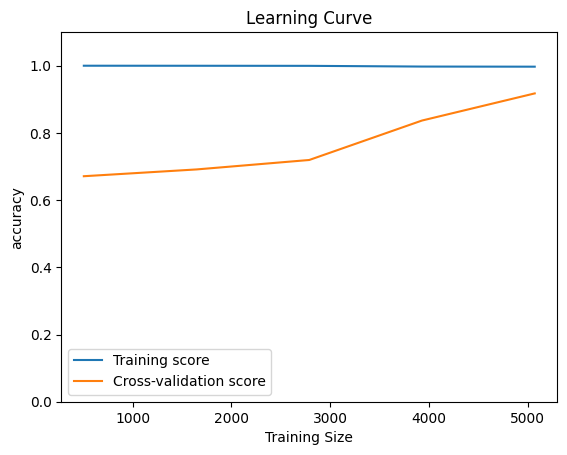

In [77]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt

print('Total of rows in the cleaned dataset: ', df.shape[0])
print('20% of the total: ', df.shape[0] / 5)

# Visualize the learning and training curves to identify overfitting
def plot_learning_curve(estimator, X, y, cv=None, scoring='accuracy'):
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, scoring=scoring, n_jobs=-1)
    
    train_scores_mean = train_scores.mean(axis=1)
    test_scores_mean = test_scores.mean(axis=1)
    
    plt.figure()
    plt.plot(train_sizes, train_scores_mean, label='Training score')
    plt.plot(train_sizes, test_scores_mean, label='Cross-validation score')
    plt.xlabel('Training Size')
    plt.ylabel(scoring)
    plt.title('Learning Curve')
    plt.ylim(0, 1.1)
    plt.legend()
    plt.show()

plot_learning_curve(pipeline_rfc, X, y, cv=5)

Considering the total of 6337 entries, currently 1267 entries are used for the training, which puts the Training Score at around 1 and the Cross-validation score at ~0.7, which indicates overfitting. With a larger training sample, the overfitting should cease to be an issue.

#### Decision Tree

In [78]:
# Create the pipeline for Decision Tree
pipeline_dt = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

# Train the Decision Tree model
pipeline_dt.fit(X_train, y_train)

# Make predictions with Decision Tree
y_pred_dt = pipeline_dt.predict(X_test)

# Evaluate the Decision Tree model
print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_dt))
print("Decision Tree Accuracy:", accuracy_score(y_test, y_pred_dt))

# Store accuracy
accuracy_dt = accuracy_score(y_test, y_pred)

Decision Tree Classification Report:
              precision    recall  f1-score   support

           N       0.94      0.87      0.90       866
           Y       0.75      0.89      0.82       402

    accuracy                           0.87      1268
   macro avg       0.85      0.88      0.86      1268
weighted avg       0.88      0.87      0.88      1268

Decision Tree Accuracy: 0.8730283911671924


In [79]:
# from sklearn import tree
# dt_model = pipeline_dt.named_steps['classifier']
# plt.figure(figsize=(30, 10))
# tree.plot_tree(dt_model, )

#### K-Nearest Neighbors Classifier

In [80]:
# Create the pipeline for K-Nearest Neighbors
pipeline_knn = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', KNeighborsClassifier())
])

# Train the K-Nearest Neighbors model
pipeline_knn.fit(X_train, y_train)

# Make predictions with K-Nearest Neighbors
y_pred_knn = pipeline_knn.predict(X_test)

# Evaluate the K-Nearest Neighbors model
print("K-Nearest Neighbors Classification Report:")
print(classification_report(y_test, y_pred_knn))
print("K-Nearest Neighbors Accuracy:", accuracy_score(y_test, y_pred_knn))

K-Nearest Neighbors Classification Report:
              precision    recall  f1-score   support

           N       0.83      0.83      0.83       866
           Y       0.64      0.64      0.64       402

    accuracy                           0.77      1268
   macro avg       0.74      0.74      0.74      1268
weighted avg       0.77      0.77      0.77      1268

K-Nearest Neighbors Accuracy: 0.7720820189274448


#### Support Vector Machine

In [81]:
# Create the pipeline for Support Vector Machine
pipeline_svc = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', SVC(random_state=42))
])

# Train the Support Vector Machine model
pipeline_svc.fit(X_train, y_train)

# Make predictions with Support Vector Machine
y_pred_svc = pipeline_svc.predict(X_test)

# Store accuracy
accuracy_svc = accuracy_score(y_test, y_pred) # 

# Evaluate the Support Vector Machine model
print("Support Vector Machine Classification Report:")
print(classification_report(y_test, y_pred_svc))
print("Support Vector Machine Accuracy:", accuracy_score(y_test, y_pred_svc))

Support Vector Machine Classification Report:
              precision    recall  f1-score   support

           N       0.85      0.88      0.86       866
           Y       0.71      0.66      0.68       402

    accuracy                           0.81      1268
   macro avg       0.78      0.77      0.77      1268
weighted avg       0.80      0.81      0.81      1268

Support Vector Machine Accuracy: 0.807570977917981


## Interactive ML

In [82]:
!pip install ipywidgets

In [83]:
import ipywidgets as widgets
from IPython.display import display
#from sklearn.ensemble import RandomForestClassifier
#from sklearn.model_selection import train_test_split
#from sklearn.preprocessing import LabelEncoder

# Interactive
age_slider = widgets.IntText(description= 'Age', min=0, max=99)
activity_dd = widgets.Dropdown(options=sorted(X['Activity (Categorized)'].unique()), description='Activity:')
gender_dd = widgets.Dropdown(options=['Male', 'Female'], description='Gender:')
time_dd = widgets.Dropdown(options=sorted(X['Time'].unique()), description='Time:')
country_dd = widgets.Dropdown(options=sorted(X['Country'].unique()), description='Country:')
location_dd = widgets.Dropdown(options=sorted(X['Location'].unique()), description='Location:') # TODO: restrict to Locations within the selected Country
predict_btn = widgets.Button(description='Predict Fatal')

# Formats fatality %
def format_fatal(prediction):
    chance_of_fatality = 0
    
    if prediction == 'Y':
        # If the model predicts the person is going to die if they encounter a shark, then the % of fatality is the model's accuracy
        # TODO: consider using the model's precision for the Y (Yes fatal) class
        chance_of_fatality = accuracy_rfc
        
        return f'You are probably going to die if you encounter a shark, be careful! (Chance of facing death: {chance_of_fatality * 100:.2f}%)'
        
    if prediction == 'N':
        # If the model predicts the person is **not** going to die if they encounter a shark, then the % of fatality is the % of the model being wrong (100% minus the model's accuracy)
        # TODO: consider using the model's precision for the N (No fatal) class
        chance_of_fatality = 1 - accuracy_rfc
        
        return f'You are probably not going to die, even if you encounter a shark. (Chance of facing death: {chance_of_fatality * 100:.2f}%)'
        
    return 'Something went wrong'

# Função de previsão
def predict_fatal(b):
    input_df = pd.DataFrame({
        # 'Activity': [activity_dd.value],
        'Age': [age_slider.value],
        'Activity (Categorized)': [activity_dd.value],
        'Predicted Gender': [gender_dd.value],
        'Time': [time_dd.value],
        'Country': [country_dd.value],
        'Location': [location_dd.value],
        'Attack or Encounter': None,
    })
    pred = pipeline_rfc.predict(input_df)[0] # This is either 'Y' or 'N'
    print(format_fatal(pred))

# Bind button to the predict function
predict_btn.on_click(predict_fatal)

# Display widgets
# display(age_slider, activity_dd, gender_dd, time_dd, country_dd, predict_btn)
display(age_slider, activity_dd, gender_dd, time_dd, country_dd, location_dd, predict_btn)

IntText(value=0, description='Age')

Dropdown(description='Activity:', options=('Casual Water Activities', 'Fishing and Hunting', 'Interaction with…

Dropdown(description='Gender:', options=('Male', 'Female'), value='Male')

Dropdown(description='Time:', options=('Afternoon', 'Evening', 'Morning', 'Unknown'), value='Afternoon')

Dropdown(description='Country:', options=('AMERICAN SAMOA', 'ARGENTINA', 'AUSTRALIA', 'BAHAMAS', 'BARBADOS', '…

Dropdown(description='Location:', options=('"Bellynahinch" on the Manning River', '"Bunkers" Eureka, Humboldt …

Button(description='Predict Fatal', style=ButtonStyle())

In [84]:
#df_found=df[df['Country']=='AUSTRALIA']
df_found = df[df['Country'] == country_dd.value]
df_found[['Country', 'Location']]

df[df['Fatal'] == 'Y']

,Case Number,Time,Date,Year,Type,Country,Fatal,Injury,Area,Location,Activity,Name,Victim's Gender,Age,Species,Activity (Categorized),Attack or Encounter,Predicted Gender
7,2020.01.05,Afternoon,05-Jan-2020,2020.0,Unprovoked,AUSTRALIA,Y,FATAL,Western Australia,Cull Island / Esperance,Scuba diving,Gary Johnson,M,57.0,White shark,Underwater Activities,Attack,Male
9,2020.01.02,Afternoon,02-Jan-2020,2020.0,Questionable,AUSTRALIA,Y,Probable drowning and scavenging,Western Australia,Esperance,Swimming after being swept off rocks,Eric Birighitti,M,21.0,Unknown,Casual Water Activities,Encounter,Male
12,2019.12.26.b,Afternoon,26-Dec-2019,2019.0,Unprovoked,PAPUA NEW GUINEA,Y,FATAL,Central Province,Ragelapara reef,Spearfishing,Kala Gerea,M,33.0,Unknown,Fishing and Hunting,Attack,Female
29,2019.11.02,Unknown,02-Nov-2019,2019.0,Questionable,REUNION ISLAND,Y,Hand recovered from shark but death may have b...,Saint-Gilles,L’Hermitage Lagoon,Snorkeling,Richard Martyn Turner,NaN,44.0,10' tiger shark,Underwater Activities,Attack,Male
71,2019.06.26,Afternoon,26-Jun-2019,2019.0,Unprovoked,BAHAMAS,Y,FATAL,Lucayan Archipelago,Rose Island,Snorkeling,Jordan Lindsey,NaN,21.0,Unknown,Underwater Activities,Attack,Male
78,2019.05.29,Unknown,29-May-2019,2019.0,Unprovoked,NEW CALEDONIA,Y,FATAL,Bélep Islands,Cook Reef,Fishing,Boris Bouanaoue,NaN,43.0,Unknown,Fishing and Hunting,Attack,Male
79,2019.05.25.b,Morning,25-May-2019,2019.0,Unprovoked,USA,Y,FATAL,Hawaii,"Honokowai Point, Maui",Swimming,Thomas Smiley,NaN,65.0,Unknown,Casual Water Activities,Attack,Male
112,2018.12.18,Morning,18-Dec-2018,2018.0,Unprovoked,MEXICO,Y,FATAL,Sonora,Southeast of Puerto Peñasco,Diving,Nahum Verdugo Aguilera,NaN,35.0,Tiger shark,Unknown,Attack,Male
124,2018.11.05,Afternoon,05-Nov-2018,2018.0,Unprovoked,AUSTRALIA,Y,FATAL,Queensland,"Cid Harbor, Whitsundays",Swimming,Daniel Christidis,NaN,33.0,Unknown,Casual Water Activities,Attack,Male
157,2018.06.03.a,Afternoon,03-Jun-2018,2018.0,Unprovoked,BRAZIL,Y,FATAL,Pernambuco,"Piedade Beach, Recife",Swimming,Jose Ernesto da Silva,NaN,18.0,Tiger shark,Casual Water Activities,Attack,Male


## Fatal Heatmap

In [85]:
#df.dtypes

In [86]:
#X = df[['Time', 'Country', 'Location', 'Activity', 'Age', 'Injury', 'Predicted Gender', 'Attack or Encounter']]  # ajuste conforme suas colunas

# Realizar predições
#df['attack_prediction'] = pipeline_svc.predict(X)

# Filtrar apenas os ataques previstos como reais (assumindo que o modelo retorna 1 para ataques)
#df_attacks = df[df['attack_prediction'] == 1]


In [87]:
# Suponha que place_data é o DataFrame que contém dados de geolocalização com as colunas 'state_name', 'country_name', 'latitude', e 'longitude'
# Ajuste os nomes das colunas e as condições do merge conforme necessário
#df_fatal_predictions = pd.merge(df_attacks, place_data, left_on=['Location', 'Country'], right_on=['state_name', 'country_name'], how='left')

In [88]:
# Teste com dados conhecidos
#test_df = pd.DataFrame({
    #'state_name': ['hawaii', 'california']
#})
#test_merge = pd.merge(test_df, place_data, on='state_name', how='left')
#print(test_merge)

In [89]:
#print(df[['Country', 'Area']].head(10))
#print(place_data[['state_name', 'country_name']].head(10))

In [90]:
#import folium
#from folium.plugins import HeatMap

# Supondo que 'latitude' e 'longitude' estão disponíveis em df_fatal_predictions
#data_list = df_fatal_predictions[['latitude', 'longitude']].dropna().values.tolist()

# Criar um mapa base
#map = folium.Map(location=[10, -20], zoom_start=3)  # Ajuste o centro e o zoom conforme necessário

# Adicionar camada de heatmap
#HeatMap(data_list, radius=7, blur=5).add_to(map)

# Exibir o mapa
#map

In [91]:
# plotting correlation heatmap 
#df=df.heatmap(data.corr()) 
  
# displaying heatmap 
#mp.show()